# Neural Networks in PySpark

Who has not had that dream? In the middle of the night, we lie awake and think of PySpark. Then, in the silverly moonshine, we think of neural networkss and an ardent wish fills our hearts: How can we run Deep Learning models on DataBricks?

PySpark's ``ML`` libraries contains a few utilities to work with neural networks, however there is no dedicated, built-in library to define neural networks.
Recently, the ``TorchEstimator`` has been introduced, allowing for the use of Spark's parallelization capabilities for the training of neural networks.

In this notebook, we are going to cover two approaches to working with neural networks:
1. Spark ML's built-in estimators
2. Using PyTorch on top of the ``TorchEstimator``

In a third step, we are going to leverage a pre-trained model in PyTorch to perform image classification.

We need to instantiate a specific type of cluster, an ``ML`` cluster. This comes with pre-installed Python libraries.

### Imports

First, we require some imports. The ``MultilayerPerceptronClassifier`` is contained within the ``ml`` module.

In [0]:
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.classification import MultilayerPerceptronClassifier
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.sql.functions import *

from pyspark.sql.types import IntegerType

### Preprocessing

The ``MNIST`` dataset is normally stored using images. We are going to use that dataset later. To perform image classification using Spark's built-in models, we will need to use a flattened format of the dataset.

In [0]:
# First, we load the MNIST dataset in a tabular representation
mnist_data = spark.read.options(header = False, inferSchema = True).csv("/FileStore/mnist_data.csv")

In [0]:
# Splitting into training, testing data
training, testing = mnist_data.randomSplit([0.7, 0.3], 7531543) # 753: The Year Rome was founded

In [0]:
# First, we need to identify all columns relevant for the model
# In the tabular representation, the MNIST data's columns correspond to the pixel values
feature_columns = ["_c" + str(i+1) for i in range(784)]

### Putting the model together

We are now going to assemble the pixel values into a dense vector representation for our model. Remember the API of the ``ml`` library: ``inputCol(s)`` are the column holding features and ``outputCol`` hold the single output column after the transformation.

In [0]:
vectorizer = VectorAssembler(inputCols=feature_columns, outputCol="features")

In [0]:
# Assemble features for training dataset
training = (vectorizer
            .transform(training)
            .select("_c0", "features")
            .toDF("label", "features")
            .cache())

In [0]:
# The features have been encoded as a sparse vector
display(training)

label,features
0,"Map(indices -> List(261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 340, 341, 342, 343, 344, 345, 346, 353, 354, 355, 356, 357, 358, 359, 368, 369, 370, 371, 372, 373, 384, 385, 386, 387, 396, 397, 398, 399, 400, 401, 413, 414, 415, 424, 425, 426, 427, 440, 441, 442, 443, 452, 453, 454, 455, 456, 466, 467, 468, 469, 470, 471, 481, 482, 483, 484, 485, 486, 487, 488, 489, 490, 491, 492, 493, 494, 495, 496, 497, 498, 499, 509, 510, 511, 512, 513, 514, 515, 516, 517, 518, 519, 520, 521, 522, 523, 524, 525, 526, 539, 540, 541, 542, 543, 544, 545, 546, 547, 548, 549, 550, 551, 552, 571, 572, 573, 574, 575, 576, 577, 578), length -> 784, values -> List(20.0, 53.0, 155.0, 155.0, 155.0, 155.0, 155.0, 55.0, 32.0, 32.0, 32.0, 3.0, 3.0, 38.0, 114.0, 220.0, 253.0, 253.0, 253.0, 253.0, 253.0, 253.0, 253.0, 253.0, 253.0, 253.0, 170.0, 46.0, 2.0, 30.0, 174.0, 253.0, 253.0, 253.0, 224.0, 210.0, 210.0, 210.0, 210.0, 210.0, 149.0, 225.0, 253.0, 253.0, 253.0, 253.0, 114.0, 1.0, 29.0, 217.0, 253.0, 253.0, 247.0, 125.0, 27.0, 28.0, 80.0, 128.0, 224.0, 253.0, 253.0, 91.0, 158.0, 253.0, 226.0, 253.0, 244.0, 93.0, 31.0, 213.0, 253.0, 217.0, 254.0, 253.0, 146.0, 140.0, 191.0, 103.0, 112.0, 253.0, 253.0, 160.0, 253.0, 249.0, 80.0, 29.0, 211.0, 253.0, 220.0, 32.0, 219.0, 253.0, 209.0, 66.0, 28.0, 124.0, 221.0, 253.0, 253.0, 93.0, 37.0, 253.0, 253.0, 247.0, 205.0, 183.0, 81.0, 81.0, 81.0, 81.0, 81.0, 81.0, 184.0, 223.0, 253.0, 253.0, 253.0, 119.0, 1.0, 3.0, 43.0, 124.0, 253.0, 253.0, 253.0, 253.0, 253.0, 253.0, 253.0, 253.0, 253.0, 253.0, 253.0, 253.0, 217.0, 112.0, 2.0, 4.0, 52.0, 160.0, 160.0, 178.0, 253.0, 253.0, 253.0, 253.0, 253.0, 253.0, 173.0, 51.0, 22.0, 6.0, 30.0, 30.0, 64.0, 57.0, 30.0, 30.0, 5.0), vectorType -> sparse)"
0,"Map(indices -> List(241, 242, 243, 244, 245, 246, 247, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 329, 330, 331, 332, 343, 344, 345, 346, 347, 351, 352, 358, 359, 360, 370, 371, 372, 373, 374, 375, 385, 386, 387, 388, 397, 398, 399, 400, 401, 402, 412, 413, 414, 415, 416, 425, 426, 427, 428, 429, 439, 440, 441, 442, 443, 444, 453, 454, 455, 456, 464, 465, 466, 467, 468, 469, 470, 471, 481, 482, 483, 490, 491, 492, 493, 494, 495, 496, 497, 498, 509, 510, 511, 512, 513, 514, 515, 516, 517, 518, 519, 520, 521, 522, 523, 524, 537, 538, 539, 540, 541, 542, 543, 544, 545, 546, 547, 548, 549, 566, 567, 568, 569, 570, 571, 572, 573, 574, 575, 595, 596, 597, 598, 599), length -> 784, values -> List(32.0, 77.0, 189.0, 189.0, 159.0, 72.0, 10.0, 38.0, 92.0, 207.0, 207.0, 207.0, 207.0, 207.0, 228.0, 253.0, 253.0, 253.0, 253.0, 253.0, 213.0, 56.0, 38.0, 224.0, 253.0, 253.0, 253.0, 253.0, 253.0, 253.0, 206.0, 147.0, 147.0, 147.0, 174.0, 253.0, 253.0, 135.0, 2.0, 40.0, 225.0, 253.0, 253.0, 247.0, 173.0, 129.0, 222.0, 207.0, 17.0, 3.0, 145.0, 253.0, 137.0, 65.0, 253.0, 253.0, 253.0, 225.0, 34.0, 70.0, 84.0, 253.0, 187.0, 98.0, 223.0, 253.0, 253.0, 167.0, 4.0, 11.0, 166.0, 253.0, 135.0, 5.0, 177.0, 253.0, 253.0, 163.0, 9.0, 12.0, 164.0, 253.0, 253.0, 135.0, 110.0, 253.0, 253.0, 162.0, 11.0, 46.0, 165.0, 253.0, 253.0, 223.0, 39.0, 236.0, 253.0, 233.0, 41.0, 36.0, 95.0, 155.0, 237.0, 253.0, 253.0, 178.0, 41.0, 255.0, 253.0, 200.0, 27.0, 148.0, 239.0, 253.0, 253.0, 253.0, 232.0, 111.0, 5.0, 133.0, 253.0, 252.0, 215.0, 130.0, 81.0, 126.0, 130.0, 205.0, 250.0, 253.0, 253.0, 243.0, 180.0, 110.0, 4.0, 16.0, 242.0, 253.0, 253.0, 253.0, 253.0, 253.0, 253.0, 253.0, 253.0, 244.0, 125.0, 10.0, 70.0, 238.0, 253.0, 253.0, 253.0, 252.0, 206.0, 186.0, 88.0, 62.0, 48.0, 70.0, 70.0, 70.0, 69.0), vectorType -> sparse)"
0,"Map(indices -> List(208, 209, 210, 234, 235, 236, 237, 238, 239, 240, 2

In [0]:
# Assemble features for testing dataset
testing = (vectorizer
           .transform(testing)
           .select("_c0", "features")
           .toDF("label", "features")
           .cache())

In [0]:
# We can inspect the array representation of our dataset
example_observation = training.first().features.toArray()
print(example_observation)

[  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0. 

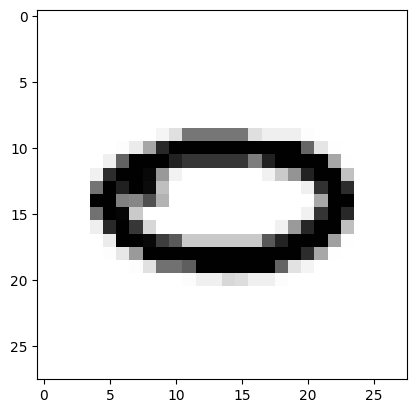

In [0]:
import matplotlib.pyplot as plt

# We will visualize a sample observation
plt.imshow(example_observation.reshape(28, 28), cmap="Greys")

Spark's MLib module contains a classic neural network algorithm, the multilayer perceptron. 

The Multilayer Perceptron (MLP) is a class of artificial neural network that has been a fundamental component of deep learning and machine learning. Its origins can be traced back to the mid-20th century, with the development of the perceptron by Frank Rosenblatt in 1957. The perceptron was a simple model of a biological neuron, capable of learning linear decision boundaries. However, it was later shown to have significant limitations, particularly its inability to solve non-linearly separable problems, as highlighted by Marvin Minsky and Seymour Papert in their 1969 book "Perceptrons."

In [0]:
# For the MLP, it is essential that the last layer be of as many output neurons as their are unique labels
# We can generate the input size of the first layer from the attributes of our data

# Define a UDF to calculate the size of the features
def feature_size(vector):
    return vector.size

# Register the UDF
feature_size_udf = udf(feature_size, IntegerType())

# Add a new column with the size of the features
input_feature_size = training.withColumn("feature_size", feature_size_udf(training["features"]))

# Store result
  = input_feature_size.select("feature_size").distinct().collect()[0].feature_size

In [0]:
# Instantiate the model instance
layer_spec = [input_layer_size, 50, 10]
mlp = MultilayerPerceptronClassifier(
    layers=layer_spec,
    featuresCol="features",
    labelCol="label", 
    seed=7531453
)

In [0]:
# We are now going to train our model
perceptron_model = mlp.fit(training)

In [0]:
evaluator = MulticlassClassificationEvaluator(labelCol="label", 
                                               predictionCol="prediction", 
                                               metricName="accuracy")

test_pred = perceptron_model.transform(testing).withColumn("matched", expr("label == prediction"))

# Evaluate the model 
evaluator.evaluate(test_pred)

0.877491961414791

In [0]:
# Summarize model results per class
(
    test_pred
    .withColumn("matched", expr("cast(matched as int)"))
    .groupby("label")
    .agg(avg("matched"))
    .orderBy("label")
    .show()
)

+-----+------------------+
|label|      avg(matched)|
+-----+------------------+
|    0|0.9612676056338029|
|    1| 0.985632183908046|
|    2|0.9038461538461539|
|    3|0.8364197530864198|
|    4| 0.860248447204969|
|    5|0.7408637873754153|
|    6|0.9216300940438872|
|    7|0.8719512195121951|
|    8|0.8213058419243986|
|    9|0.8576512455516014|
+-----+------------------+



## PyTorch in Spark

We will now run a PyTorch model on top of Spark using PyTorch. 

Check out DataBricks announcement of the ``TorchDistributor``:
https://www.databricks.com/blog/2023/04/20/pytorch-databricks-introducing-spark-pytorch-distributor.html

The ``TorchDistributor`` is a tool that allows PyTorch models to be run in a distributed environment using Apache Spark. It enables the distribution of PyTorch models across multiple nodes in a Spark cluster, allowing for parallel processing and faster training times.

Essentially, Spark does not offer its own neural network library and instead focuses on parallelizing training processes run in ``PyTorch`` and other frameworks.

As a good practice, we will leverage ``PyTorch Lightning`` for a nice encapsulation of our model building.

In [0]:
!pip install lightning

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


In [0]:
# In case libraries need to be updated, run:
dbutils.library.restartPython()

In [0]:
import functools
import operator

import torch
from torch import optim, nn, utils, Tensor

import lightning as L

import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

from torchvision import datasets, transforms

import torchmetrics
import torchmetrics.classification

2024-11-10 09:48:08.779959: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-11-10 09:48:08.784328: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-11-10 09:48:08.837473: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-11-10 09:48:09.943989: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [0]:
from pyspark.ml.torch.distributor import TorchDistributor

In [0]:
username = spark.sql("SELECT current_user()").first()['current_user()']

data_path = "/local_disk/mnist"
log_path = "/local_disk/pl_training_logger"

In [0]:
class MNISTNet(L.LightningModule):
    def __init__(self, learning_rate, kernel_size, conv2_layer1, conv2_layer2, linear_layer1, linear_layer2, input_dim=(28, 28)):
        super(MNISTNet, self).__init__()
        
        # Save hyperparameters
        self.save_hyperparameters()
        
        self.num_classes=10

        # Define scores from torchmetrics
        self.train_f1_score = torchmetrics.classification.F1Score(task="multiclass", num_classes=10, average="macro")
        self.val_f1_score = torchmetrics.classification.F1Score(task="multiclass", num_classes=10, average="macro")
        self.test_f1_score = torchmetrics.classification.F1Score(task="multiclass", num_classes=10, average="macro")
        
        # Assign hyperparameters
        self.learning_rate = learning_rate
        self.kernel_size = kernel_size
        self.conv2_layer1 = conv2_layer1
        self.conv2_layer2 = conv2_layer2
        self.linear_layer1 = linear_layer1
        self.linear_layer2 = linear_layer2
        
        # Define the feature extractor
        self.feature_extractor = nn.Sequential(
            nn.Conv2d(in_channels=1, out_channels=self.conv2_layer1, kernel_size=self.kernel_size),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=1),
            nn.Conv2d(in_channels=self.conv2_layer1, out_channels=self.conv2_layer2, kernel_size=self.kernel_size),
            nn.ReLU(inplace=True)
        )
        
        # This code will compute the number of features going into the linear layer
        num_features_before_linear_layer = functools.reduce(
            operator.mul, list(self.feature_extractor(torch.rand(1, *input_dim)).shape)
        )
        
        # This will consist only of linear layers
        self.image_classifier = nn.Sequential(
            nn.Linear(in_features=num_features_before_linear_layer, out_features=self.linear_layer1),
            nn.Linear(in_features=self.linear_layer1, out_features=self.linear_layer2),
            nn.Linear(in_features=self.linear_layer2, out_features=self.num_classes),
        )
        
    def forward(self, x):
        batch_size = x.size(0)
        out = self.feature_extractor(x)
        out = out.view(batch_size, -1)  # Flatten the vector
        out = self.image_classifier(out)
        logits = torch.softmax(out, dim=1)

        return logits
    
    def training_step(self, batch, batch_idx):
        data, labels = batch
        labels = torch.clamp(labels, max=self.num_classes - 1)
        logits = self.forward(data)
        loss = F.nll_loss(logits, labels)
        
        self.train_f1_score(logits.argmax(1), labels)
        self.log("train_loss", loss, on_epoch=True, sync_dist=True)
        self.log("train_f1_step", self.train_f1_score, on_step=False, on_epoch=True, sync_dist=True)
        
        return loss
        
    def validation_step(self, batch, batch_idx):
        data, labels = batch
        labels = torch.clamp(labels, max=self.num_classes - 1)
        logits = self.forward(data)
        loss = F.nll_loss(logits, labels)
        
        self.val_f1_score(logits.argmax(1), labels)
        self.log("val_loss", loss, on_epoch=True, sync_dist=True)
        self.log("val_f1_score", self.val_f1_score, on_step=False, on_epoch=True, sync_dist=True)
        
        return loss
        
    def test_step(self, batch, batch_idx):
        data, labels = batch
        labels = torch.clamp(labels, max=self.num_classes - 1)
        logits = self.forward(data)
        loss = F.nll_loss(logits, labels)
        
        self.val_f1_score(logits.argmax(1), labels)
        self.log("test_loss", loss, on_epoch=True, sync_dist=True)
        self.log("test_f1_score", self.test_f1_score, on_step=False, on_epoch=True, sync_dist=True)

        return loss
    
    def predict_step(self, batch, batch_idx):
        inputs = batch
        predictions = self(inputs)
        return predictions.argmax(1)
        
    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=self.learning_rate)
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(
                optimizer, mode="min", factor=0.1, patience=5
            )
            
        return {
            "optimizer": optimizer,
            "lr_scheduler": {
                "scheduler": scheduler,
                "monitor": "val_loss",
            },
        }

In [0]:
# Define a class for the MNIST data module
class MnistDataModule(L.LightningDataModule):
  # Initialize the class with the data directory and batch size
  def __init__(self, data_dir: str, batch_size: int):
    super().__init__()
    self.data_dir = data_dir
    self.batch_size = batch_size

    # Define the transformation to be applied to the data
    self.transform = transforms.Compose([
      transforms.ToTensor(),  # Convert the image to a tensor
      transforms.Normalize((0.1307,), (0.3081,))  # Normalize the tensor image with mean 0.1307 and standard deviation 0.3081
    ])

  # Setup the data for training, validation, testing, and prediction
  def setup(self, stage: str):
    # Download and load the test dataset
    self.mnist_test = datasets.MNIST(self.data_dir, download=True, train=False, transform=self.transform)

    # Download and load the prediction dataset
    self.mnist_predict = datasets.MNIST(self.data_dir, download=True, train=False, transform=self.transform)

    # Download and load the full training dataset
    mnist_full = datasets.MNIST(self.data_dir, download=True, train=True, transform=self.transform)

    # Split the full training dataset into training and validation datasets
    self.mnist_train, self.mnist_val = utils.data.random_split(mnist_full, [0.8, 0.2])

  # Define the data loader for training
  def train_dataloader(self):
    return utils.data.DataLoader(self.mnist_train, batch_size=self.batch_size)

  # Define the data loader for validation
  def val_dataloader(self):
    return utils.data.DataLoader(self.mnist_val, batch_size=self.batch_size)

  # Define the data loader for testing
  def test_dataloader(self):
    return utils.data.DataLoader(self.mnist_test, batch_size=self.batch_size)

  # Define the data loader for prediction
  def predict_dataloader(self):
    return utils.data.DataLoader(self.mnist_predict, batch_size=self.batch_size)


In [0]:
def main_training_loop(num_tasks, num_proc_per_task):
    """
    Main train and test loop
    """
    # add imports inside pl_train for pickling to work
    import os
    from torch import optim, nn, utils, Tensor
    from torchvision import datasets, transforms
    import lightning as L
  
    ############################  
    # NCCL P2P can cause issues with incorrect peer settings, so let's turn this off for now
    os.environ['NCCL_P2P_DISABLE'] = '1'
    
    EPOCHS = 10
    BATCH_SIZE = 32
      
    params = {
        "epochs": EPOCHS,
        "learning_rate": 1e-3,
        "batch_size": BATCH_SIZE,
        "optimizer": "ADAM",
        "kernel_size": 3,
        "conv2_layer1": 64,
        "conv2_layer2": 32,
        "conv2_layer3": 16,
        "linear_layer1": 40,
        "linear_layer2": 20
    }
    
    # Instantiate model
    net = MNISTNet(
        params["learning_rate"], params["kernel_size"], params["conv2_layer1"], 
        params["conv2_layer2"], params["linear_layer1"], params["linear_layer2"]
    )
    # Instantiating the datamodule
    datamodule = MnistDataModule(data_dir = data_path, batch_size = BATCH_SIZE)
    
    # Train the model
    kwargs = {"strategy" : "ddp"} # --> DDP stands for "Distributed Data Parallelism"
    trainer = L.Trainer(default_root_dir=log_path, limit_train_batches=1000, max_epochs=EPOCHS, **kwargs)
    
    # Fit model
    trainer.fit(model=net, datamodule=datamodule)
    
    # Test model
    trainer.test(model=net, datamodule=datamodule)
    
    return net, trainer.checkpoint_callback.best_model_path

In [0]:
NUM_PROC = 1
NUM_TASKS = 1
NUM_PROC_PER_TASK = 1

# Unfortunately, we are not able to use the GPU :/ 
# The torch distributor is the icing on the cake, allowing us to use pure PyTorch Lightning code and accelerate
# it on Spark
(model, ckpt_path) = TorchDistributor(num_processes=NUM_PROC, local_mode=True, use_gpu=False).run(main_training_loop, NUM_TASKS, NUM_PROC_PER_TASK) 

INFO:TorchDistributor:Started local training with 1 processes


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
Initializing distributed: GLOBAL_RANK: 0, MEMBER: 1/1
----------------------------------------------------------------------------------------------------
distributed_backend=gloo
All distributed processes registered. Starting with 1 processes
----------------------------------------------------------------------------------------------------

2024-11-10 09:48:19.739122: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-11-10 09:48:19.744061: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-11-10 09:48:19.794092: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations,

INFO:TorchDistributor:Finished local training with 1 processes


Testing DataLoader 0: 100%|██████████| 313/313 [00:14<00:00, 21.10it/s]/local_disk0/.ephemeral_nfs/envs/pythonEnv-710b9e8e-6a6d-428a-9076-7da6e8718450/lib/python3.11/site-packages/torchmetrics/utilities/prints.py:43: UserWarning: The ``compute`` method of metric MulticlassF1Score was called before the ``update`` method which may lead to errors, as metric states have not yet been updated.
  warnings.warn(*args, **kwargs)  # noqa: B028
Testing DataLoader 0: 100%|██████████| 313/313 [00:14<00:00, 21.09it/s]
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_f1_score       │            0.0            │
│         test_loss         │    -0.8676878213882446    │
└───────────────────────────┴───────────────────────────┘


## Transfer Learning using Spark

Using pandas UDFs, we are able to work with all sorts of external libraries. A common task is to take a pre-trained model, apply it to unseen inputs and then use those features as inputs to other algorithms, that is we are working with a ``Transfer Learning`` task.

In [0]:
import io
from PIL import Image

import pandas as pd
import numpy as np

import torch
from torchvision import transforms

In [0]:
from pyspark.sql.functions import col, pandas_udf, PandasUDFType
from pyspark.sql.types import FloatType, ArrayType

In [0]:
from torchvision.models import resnet50, ResNet50_Weights

# Using pretrained weights:
weights = ResNet50_Weights.DEFAULT
model = resnet50(weights=weights)

# Load and prepare the model on the driver
model.eval()
model = torch.nn.Sequential(*list(model.children())[:-1])  # Removing the final classification layer (only features wanted)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 120MB/s]


In [0]:
def compose_transforms():
    # Create a list of image transformations using the torchvision.transforms module.
    # The transformations are applied in the order that they are listed in the list.
    transform = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    return transform

Now, if you want each node to use a machine learning model, like ResNet50, to process these images, you have a couple of choices:

1. Load the model separately on each node: Every node loads its own copy of the model. This works, but there's a downside—it takes up more memory and time. The model is large, so loading it every time a node needs it can slow things down and consume a lot of resources.

2. Broadcast the model: Instead of loading the model over and over, you load it once on the main driver (where the code is managed) and then broadcast it. Broadcasting means sending one copy of the model to each node just once. So now, each node can reuse that copy instead of reloading it for every task.

In [0]:
# Broadcast the model to all executors
broadcasted_model = sc.broadcast(model)
broadcasted_transform = sc.broadcast(compose_transforms())

In [0]:
def batch_extract_features(image_series: pd.Series) -> pd.Series:
    model = broadcasted_model.value  # Access the broadcasted model
    image_transform = broadcasted_transform.value # Access the broadcasted transforms
    batch_images = []
    
    # Convert each image byte data into a preprocessed tensor
    for image_bytes in image_series:
        image = Image.open(io.BytesIO(image_bytes)).convert("RGB")
        input_tensor = image_transform(image)
        batch_images.append(input_tensor)

    # Stack all images into a single batch tensor
    batch_tensor = torch.stack(batch_images)
    
    # == Perform inference ==
    # Squeeze removes a dimension from the model.
    # We start with a tensor of dimensions [batch_size, channels, height, width]
    # and end up with a tensor of [batch_size, num_features (2048), 1, 1]
    # We now have a global summary per image
    with torch.no_grad():
        features_batch = model(batch_tensor).squeeze()  # Forward pass through the model. 

    # Convert features to a list of numpy arrays (one per image)
    return pd.Series([features.numpy() for features in features_batch])

# Register the UDF with Spark, declaring the return type as an array of floats
extract_features_udf = pandas_udf(batch_extract_features, returnType=ArrayType(FloatType()))

We will now need our dataset, some nice ``flowers``. This dataset comes pre-packaged on DataBricks.

In [0]:
%fs ls /databricks-datasets/flower_photos

path,name,size,modificationTime
dbfs:/databricks-datasets/flower_photos/LICENSE.txt,LICENSE.txt,418049,1576102572000
dbfs:/databricks-datasets/flower_photos/README.md,README.md,1157,1576102572000
dbfs:/databricks-datasets/flower_photos/daisy/,daisy/,0,0
dbfs:/databricks-datasets/flower_photos/dandelion/,dandelion/,0,0
dbfs:/databricks-datasets/flower_photos/roses/,roses/,0,0
dbfs:/databricks-datasets/flower_photos/sunflowers/,sunflowers/,0,0
dbfs:/databricks-datasets/flower_photos/tulips/,tulips/,0,0


In [0]:
images = spark.read.format("binaryFile") \
  .option("pathGlobFilter", "*.jpg") \
  .option("recursiveFileLookup", "true") \
  .load("/databricks-datasets/flower_photos") \
  .sample(fraction=0.1) # Get only a subset of the flower images

display(images.limit(5))

path modificationTime length content dbfs:/databricks-datasets/flower_photos/daisy/3704306975_75b74497d8.jpg 2019-12-11T22:16:24Z 240957 List(/9j/4AAQSkZJRgABAQEAYABgAAD/2wBDAAEBAQEBAQEBAQEBAQECAgMCAgICAgQDAwIDBQQFBQUEBAQFBgcGBQUHBgQEBgkGBwgICAgIBQYJCgkICgcICAj/2wBDAQEBAQICAgQCAgQIBQQFCAgICAgICAgICAgICAgICAgICAg= (truncated), iVBORw0KGgoAAAANSUhEUgAAAGQAAABACAIAAABjvUUjAABIUklEQVR42hS4VXBb5/r27YNv5p3dJjGKmcGyzMwkM0iyZUu2ZMliZmaWLMvMTuIkDjRJmzZNSikzM9Mut7sU5rQzn/5nz6yTZ8297gt+K0sToBi9df5UD0tc6Jhpjmy2WmcrhEEqQ0RkGrHdUiIvCmMm88YTCPksYXIOMbUCFc4TTdtQqa8xerh59zHV/od5pvnGCV91nxOqT1bFtycEHopphvHwY4lnX5tdOtbj3187u8MMbNYuPSg+/PD0wu5Q6Gj5xinTh18+s3RqVJ9o8GxUGVIN1WKgdqadGaCMRJHTySpeFDM+D2HNAYT7iV0zeaLDeN1msfvhEvdatzRYKnZUTHlagsuCQSdEv9QiD9VbV2vHI6SJeeJQDBbYbTGvFZoXmozpDmkCq1wlC9Pk/hiqxw3TL7fUmfO6IlDVIpphQHXbC8QxGsMIFrq7ODZykynftlYtiVN4sxBetDR+csB5oKXfCykz7WsLgbNmVirMoSaVu0zhqggstsa2GZpFvHyOPGxFSVw1DBWSoQONzOwRpDHmAyj3Vr1sFcGZKzAuQQQzhOkUbCqBki0QJ2KYUWuxLlq//AB38xDPmeg0hIoDM93bJ6RrJ/iWtTLvWvfC7vjy8dFTTyqXTvQY1mgbj0wefUKYPNTD9xP1S6Xp/dKZQ+PTrgZOlKTfbNh4tn7pzLRupU57EB95imA/jVTtwEMnGBNpjH2rJnak49OvXv/r799/+PnrwLrasdoin6uULhU5DvYtHPNvnje6Hy6UeqrOv3wkvK4fd5eEDreoUuUML7zXCzcdLZlO07lxBDMG67ACO7WIETelZALCDIJbpSDFOiGwVLv1EOPM+yNzD/UnH2SwwpguB3h8FcpZg2RFZxqCs81jaowtxnDNNlkWy1RLGMUSplUO6dLAu62oynGIdBvSHcqejCCN6yh5kireyuP5QZwwmhXJZQQLesKQvgBaE68X++gyf3Fyfdi/1prY7gzO9wbm27dPTTgX6g6ckxw5p108PJQ+2udcaYwcro4cqnKsVe4/OxzaaRDOINUzTcHNAeNi/XiSqFytdJ+olK+Wps61DwbBa8/UzD5CW3iwbuGhZu8DhYolqjJZ+/m37/z9v53rF70//vS1fbtzOkIWJGlzJ6euXvvt1s0v3v306Qefmn//nfmPvnw8ddTKDmCda1W6LbpsrnLUhZYvlutWqd1mPN9fN+mg9JiJ3AR6Oonke8tUy9WqWfrOY8Prjwh4KaxlF8mbRwy6EJMbENE2Lssa6IivtHlT5QJD2fwBji5eo1iBxnZL7AttY16YMl7dKAA2mgs6ArnNesDkYu5oEDY1m+1Yw0zE0Fw/gZkAM4zooSiw34CTh6qnHcToXN/Mod7k/v7wEmPrsCR+oGN2s8eyQl17gG1M06xbreqF0uDR8thuc+RIw9qj1cZNqmIFPRkDWrarnLuFhu2yRhdwaoU0vU7gJwuZ5hLDcs3Oc8OugxWOg/Tgw3hZmjYeItqXa84+v/rH/97+4+9f/Ac7pTGSaZ7BdZJ1sz0bJ01nX/GqZ6qeenH7p19eeuS5OcdGy2SUdOBJEdNNCi9LX3nn2aOPJ+IHxTwLjeculfiafRt8WaJw0kcyRLu9K/3xB/q06Xrz/mrJOlH1QL58ETu9g1ZsFmYJ3Thjgji/xbKkGs2RtoMPiWZ2O4JrtZ50vSHWJLDWS4O1FSNwTgTEDoLHErDhIFCzQrDswPlzOVxfYZcXROov6PKDKsUAyQzalipV+Rq1aboxWhfbajz5oDy+VR3ZaA5tNLkXi6NbQ6mTDHmU6jtcoYjXrJzuXXqU7jxcFDpVYjpIEaeLrQcJC483DEYxzhN1kdNtkf1Sjp/o3KhfulBp3ilZfGTAcoTIj0JYPrhqBSZIUB3rDZb1jqkUVbpaJIpQNh6wXLz059fff3bm5bBqhSpYRJkPUuwHqqZnyhMnuoxbNWPOUv+BkT//evva1ec3dsPT0aIuE77dkTEyhjheqvYw3/34uTfee+LPSz9+/d9PvBtjiiMo/ZM58Rchkv2wiVlq1oAJLvURI8stU6Ei1Wx1bKNXGWgRB4vCmyXNYjjXUuhId/XyS50bdc0qYJNjH3s2pycEECzvlW3mt9uzW1x7itjQNmt2RrMsO3baRXWmmzMatCRqA2u14cX25HaHcYbkWKL5NoqsixWHX2iRLaKlqwWiJNw8T/Iepjl2KbOPliyc7nFsdq08Ubv7jPLAw7FHX07vPssdSCEGQnj1BiJ2mjq9XDTzAHtyETm9gB5LALkB3LibPhnFiReKlUulxsU63UrFoAH10tu7166+9+fFnwXJIskm1bhDNx8iKtao/m2ud7fRtNJq36qK7fJOPOZ47o3TXRoY01nk2GZwomTzUtcTryy+8fGRm7eu3br5/uUrv73z2csTs2VdPnT0PM1wHBU+Rc/iOnDGBZpvtXTShusxoO1zXbGdduUi1r5O43iRU/rqxRND3rlhpbdGHS9m2uCyJXBHaK94AcSZ3dfhuL/ScH+zBlqrypZHCruNUJaR1C8v0scbAovN0+5i12KlZ6EusjHg3ax0LBPM6erFh1uSp0tDu5XOXVToGE45j1NtgZbO4ZIP0uMPVCgWiqbT+AFLse1Itf8ktcuHESZKU7tM82zr4sO82Qf7H3jBYJ9nmrdqebNQprVIHCvRrzQolsr5SdLkHIoXLBRE6ySxMk20kxnEDcRQE3NwwRxJtEhRLJTbj5a1OoG+nWquH8MN49QrNeMRDCdCsG91vvjh+cfeOHPuhc250z27j1rXTynPPBuef0DT4QVJV0np89TIsyjrZk0W00zod4LbNAXjfuSEu9S/zIhsDdm28Pp0lf1QiT5VzVQWTTqJ7VLYgA005scpE9QmC6DTDBYkcztDe8o12T1uSK00X5GAjUQQ9WJIUQfCPd8TWGgxRisci6WxzWpFvNC8Wiybwc0e7Ywf7lAuE+fPlqYuQBceR3r3059/HfXVl3lXLgN+/hUUfQA45oGMpMmabarjSENwh8EL09XJOvFMtWWj/ZX3nvz5f79ev3HjrU/eXjsRY3sQ/Ey9CBXy54ktVtRoGlOthg96CdJUOT9ayItjRmaAwkTxgIc2PU8dj6P5KRp3AeU/3Jg61uLerewJAEcDZMvRYt3+UvtKd/rIePKoXLda2KejjdhKLCtVzu3m4WCh9Sx8+XWQchdoWKnMYhggvXrkgAPG9sGnZuH+VUZq/9TsWod4DjPmR4nWcuXOdu/igDZSM2xBDXlgvS5wuwXWbkQznRBBGi+ep09ECmvFUNksst+IKpoClLJgvRqyaa5hWEt2rBbqlwmyBFIUoPg2Ou3LZapYqWA2L3Ece+EDcPgBmGAh79ELkGMPYV94GvrL9/vWj9ZKQ1jNBo2fJI5F8IJQhShW3u+gssNE3WrD9RvXrlz5/Nq1c9duXNs9F2W6gKxIXn8Iqtoijc4iDOulzBCuwwUbi1O4cQzLi2QnsNaVdqanOLQ7wI+Qleul0iWKLEW1HSyfWEAw08AJf5FmjSJbqpEvkXlJhPd4hWwVP+iGNynBogRWFi9kJyEzpweOPCOafaLMtl2f1e3PbZWCB2yIPj0+eKgleKA+vMFQeQnOleK1s2Mz

In [0]:
# Let's get some additional functions
from pyspark.sql.functions import split, col, element_at

In [0]:
images = images \
    .withColumn(
        "label", 
        element_at(
            split(
                col("path"), "/"), 4)
        )
    
display(images.limit(5))

path modificationTime length content label dbfs:/databricks-datasets/flower_photos/daisy/3704306975_75b74497d8.jpg 2019-12-11T22:16:24Z 240957 List(/9j/4AAQSkZJRgABAQEAYABgAAD/2wBDAAEBAQEBAQEBAQEBAQECAgMCAgICAgQDAwIDBQQFBQUEBAQFBgcGBQUHBgQEBgkGBwgICAgIBQYJCgkICgcICAj/2wBDAQEBAQICAgQCAgQIBQQFCAgICAgICAgICAgICAgICAgICAg= (truncated), iVBORw0KGgoAAAANSUhEUgAAAGQAAABACAIAAABjvUUjAABIUklEQVR42hS4VXBb5/r27YNv5p3dJjGKmcGyzMwkM0iyZUu2ZMliZmaWLMvMTuIkDjRJmzZNSikzM9Mut7sU5rQzn/5nz6yTZ8297gt+K0sToBi9df5UD0tc6Jhpjmy2WmcrhEEqQ0RkGrHdUiIvCmMm88YTCPksYXIOMbUCFc4TTdtQqa8xerh59zHV/od5pvnGCV91nxOqT1bFtycEHopphvHwY4lnX5tdOtbj3187u8MMbNYuPSg+/PD0wu5Q6Gj5xinTh18+s3RqVJ9o8GxUGVIN1WKgdqadGaCMRJHTySpeFDM+D2HNAYT7iV0zeaLDeN1msfvhEvdatzRYKnZUTHlagsuCQSdEv9QiD9VbV2vHI6SJeeJQDBbYbTGvFZoXmozpDmkCq1wlC9Pk/hiqxw3TL7fUmfO6IlDVIpphQHXbC8QxGsMIFrq7ODZykynftlYtiVN4sxBetDR+csB5oKXfCykz7WsLgbNmVirMoSaVu0zhqggstsa2GZpFvHyOPGxFSVw1DBWSoQONzOwRpDHmAyj3Vr1sFcGZKzAuQQQzhOkUbCqBki0QJ2KYUWuxLlq//AB38xDPmeg0hIoDM93bJ6RrJ/iWtTLvWvfC7vjy8dFTTyqXTvQY1mgbj0wefUKYPNTD9xP1S6Xp/dKZQ+PTrgZOlKTfbNh4tn7pzLRupU57EB95imA/jVTtwEMnGBNpjH2rJnak49OvXv/r799/+PnrwLrasdoin6uULhU5DvYtHPNvnje6Hy6UeqrOv3wkvK4fd5eEDreoUuUML7zXCzcdLZlO07lxBDMG67ACO7WIETelZALCDIJbpSDFOiGwVLv1EOPM+yNzD/UnH2SwwpguB3h8FcpZg2RFZxqCs81jaowtxnDNNlkWy1RLGMUSplUO6dLAu62oynGIdBvSHcqejCCN6yh5kireyuP5QZwwmhXJZQQLesKQvgBaE68X++gyf3Fyfdi/1prY7gzO9wbm27dPTTgX6g6ckxw5p108PJQ+2udcaYwcro4cqnKsVe4/OxzaaRDOINUzTcHNAeNi/XiSqFytdJ+olK+Wps61DwbBa8/UzD5CW3iwbuGhZu8DhYolqjJZ+/m37/z9v53rF70//vS1fbtzOkIWJGlzJ6euXvvt1s0v3v306Qefmn//nfmPvnw8ddTKDmCda1W6LbpsrnLUhZYvlutWqd1mPN9fN+mg9JiJ3AR6Oonke8tUy9WqWfrOY8Prjwh4KaxlF8mbRwy6EJMbENE2Lssa6IivtHlT5QJD2fwBji5eo1iBxnZL7AttY16YMl7dKAA2mgs6ArnNesDkYu5oEDY1m+1Yw0zE0Fw/gZkAM4zooSiw34CTh6qnHcToXN/Mod7k/v7wEmPrsCR+oGN2s8eyQl17gG1M06xbreqF0uDR8thuc+RIw9qj1cZNqmIFPRkDWrarnLuFhu2yRhdwaoU0vU7gJwuZ5hLDcs3Oc8OugxWOg/Tgw3hZmjYeItqXa84+v/rH/97+4+9f/Ac7pTGSaZ7BdZJ1sz0bJ01nX/GqZ6qeenH7p19eeuS5OcdGy2SUdOBJEdNNCi9LX3nn2aOPJ+IHxTwLjeculfiafRt8WaJw0kcyRLu9K/3xB/q06Xrz/mrJOlH1QL58ETu9g1ZsFmYJ3Thjgji/xbKkGs2RtoMPiWZ2O4JrtZ50vSHWJLDWS4O1FSNwTgTEDoLHErDhIFCzQrDswPlzOVxfYZcXROov6PKDKsUAyQzalipV+Rq1aboxWhfbajz5oDy+VR3ZaA5tNLkXi6NbQ6mTDHmU6jtcoYjXrJzuXXqU7jxcFDpVYjpIEaeLrQcJC483DEYxzhN1kdNtkf1Sjp/o3KhfulBp3ilZfGTAcoTIj0JYPrhqBSZIUB3rDZb1jqkUVbpaJIpQNh6wXLz059fff3bm5bBqhSpYRJkPUuwHqqZnyhMnuoxbNWPOUv+BkT//evva1ec3dsPT0aIuE77dkTEyhjheqvYw3/34uTfee+LPSz9+/d9PvBtjiiMo/ZM58Rchkv2wiVlq1oAJLvURI8stU6Ei1Wx1bKNXGWgRB4vCmyXNYjjXUuhId/XyS50bdc0qYJNjH3s2pycEECzvlW3mt9uzW1x7itjQNmt2RrMsO3baRXWmmzMatCRqA2u14cX25HaHcYbkWKL5NoqsixWHX2iRLaKlqwWiJNw8T/Iepjl2KbOPliyc7nFsdq08Ubv7jPLAw7FHX07vPssdSCEGQnj1BiJ2mjq9XDTzAHtyETm9gB5LALkB3LibPhnFiReKlUulxsU63UrFoAH10tu7166+9+fFnwXJIskm1bhDNx8iKtao/m2ud7fRtNJq36qK7fJOPOZ47o3TXRoY01nk2GZwomTzUtcTryy+8fGRm7eu3br5/uUrv73z2csTs2VdPnT0PM1wHBU+Rc/iOnDGBZpvtXTShusxoO1zXbGdduUi1r5O43iRU/rqxRND3rlhpbdGHS9m2uCyJXBHaK94AcSZ3dfhuL/ScH+zBlqrypZHCruNUJaR1C8v0scbAovN0+5i12KlZ6EusjHg3ax0LBPM6erFh1uSp0tDu5XOXVToGE45j1NtgZbO4ZIP0uMPVCgWiqbT+AFLse1Itf8ktcuHESZKU7tM82zr4sO82Qf7H3jBYJ9nmrdqebNQprVIHCvRrzQolsr5SdLkHIoXLBRE6ySxMk20kxnEDcRQE3NwwRxJtEhRLJTbj5a1OoG+nWquH8MN49QrNeMRDCdCsG91vvjh+cfeOHPuhc250z27j1rXTynPPBuef0DT4QVJV0np89TIsyjrZk0W00zod4LbNAXjfuSEu9S/zIhsDdm28Pp0lf1QiT5VzVQWTTqJ7VLYgA005scpE9QmC6DTDBYkcztDe8o12T1uSK00X5GAjUQQ9WJIUQfCPd8TWGgxRisci6WxzWpFvNC8Wiybwc0e7Ywf7lAuE+fPlqYuQBceR3r3059/HfXVl3lXLgN+/hUUfQA45oGMpMmabarjSENwh8EL09XJOvFMtWWj/ZX3nvz5f79ev3HjrU/eXjsRY3sQ/Ey9CBXy54ktVtRoGlOthg96CdJUOT9ayItjRmaAwkTxgIc2PU8dj6P5KRp3AeU/3Jg61uLerewJAEcDZMvRYt3+UvtKd/rIePKoXLda2KejjdhKLCtVzu3m4WCh9Sx8+XWQchdoWKnMYhggvXrkgAPG9sGnZuH+VUZq/9TsWod4DjPmR4nWcuXOdu/igDZSM2xBDXlgvS5wuwXWbkQznRBBGi+ep09ECmvFUNksst+IKpoClLJgvRqyaa5hWEt2rBbqlwmyBFIUoPg2Ou3LZapYqWA2L3Ece+EDcPgBmGAh79ELkGMPYV94GvrL9/vWj9ZKQ1jNBo2fJI5F8IJQhShW3u+gssNE3WrD9RvXrlz5/Nq1c9duXNs9F2W6gKxIXn8Iqtoijc4iDOulzBCuwwUbi1O4cQzLi2QnsNaVdqanOLQ7wI+Qleul0iWKLEW1HSyfWEAw08AJf5FmjSJbqpEvkXlJhPd4hWwVP+iGNynBogRWFi9kJyEzpweOPCOafaLMtl2f1e3PbZWCB2yIPj0+eKgleKA+vMFQeQnOle

In Apache Spark, the ``repartition`` method is used to increase or decrease the number of partitions in a DataFrame. Repartitioning can be useful for optimizing the performance of subsequent operations, especially when dealing with data skew or when you want to control the parallelism of your job.

In [0]:
# Write our transformation
features_df = images \
  .repartition(16) \
  .select(col("path"), col("label"), extract_features_udf("content").alias("features"))

We can now store our features later for later usage inside of ``DBFS``.

In [0]:
features_df.write.mode("overwrite").parquet("dbfs:/FileStore/flower_photos_features")

We now have our features ready for whatever Machine Learning algorithm we choose to use.

In [0]:
display(features_df)

path label features dbfs:/databricks-datasets/flower_photos/sunflowers/2729206569_9dd2b5a3ed.jpg sunflowers List(0.002126824, 0.055173736, 0.13638298, 0.0026025039, 0.006072819, 0.046053175, 0.006918871, 0.066601425, 0.08787467, 0.0, 0.0, 0.0, 4.8204696E-5, 0.0, 0.0103313085, 0.17809957, 0.0094763525, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3598141, 0.0, 0.0, 0.0, 0.0, 0.0, 0.53252304, 0.07609914, 0.0, 0.0, 0.0, 0.1756975, 0.014552685, 2.296575, 0.0, 0.29390928, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.11951034, 0.0, 0.54213834, 0.0, 0.0026090802, 0.0, 0.0054734224, 0.0, 0.0, 0.0, 0.06462977, 0.0, 0.0, 0.0, 0.0, 0.06769181, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.15903354, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.20323034, 0.024440525, 0.009987341, 0.0, 0.0, 0.0, 0.07067666, 0.0, 0.0, 0.0, 0.19965643, 0.010153973, 0.0, 0.0015147696, 0.0, 0.03464332, 0.0, 0.0, 0.0077972054, 0.0, 0.0, 0.0, 2.5601222E-4, 0.0, 0.0, 0.0, 0.0, 0.109532684, 0.0, 0.0, 0.0, 0.0041588023, 0.0, 0.0, 0.0, 0.0, 0.0, 0.00428273, 0.0, 0.0, 0.09051701, 0.14185774, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.020069737, 0.0, 0.12615141, 0.0, 0.0, 0.0, 4.1554253E-5, 0.0, 0.009454778, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.056182094, 0.096215375, 0.0, 0.0, 0.0, 0.21341303, 0.0, 0.0, 0.007336631, 0.0, 0.0065335208, 0.0, 0.0, 0.0, 0.0, 0.07617114, 0.0, 0.0, 0.033287518, 0.0, 0.13859646, 0.0102261305, 1.8656703, 0.18072872, 0.0026537664, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.059571587, 0.028224293, 4.966858E-4, 0.0, 0.0029670526, 0.023587337, 0.060447227, 0.0, 0.0, 0.005676177, 0.0, 0.21670742, 0.012051881, 0.0, 0.0, 0.0099063385, 0.012829294, 0.012669668, 0.0, 0.0, 0.4182315, 0.0, 0.0, 0.0, 0.0, 0.08613323, 0.0, 0.0, 0.0, 0.0, 0.0, 0.03201927, 0.0, 0.0, 0.035172585, 0.0, 0.038244903, 0.0028400163, 0.13762788, 0.0, 0.0, 0.28356135, 0.0, 0.0, 0.0, 0.020551983, 0.0, 0.059197012, 0.0, 0.0019041762, 0.0, 0.0, 0.35138118, 0.0, 0.06451424, 0.0, 0.0, 0.0, 0.0109552415, 0.00404812, 0.0, 0.0, 0.008639384, 0.023138637, 0.21701731, 0.0, 0.0, 0.18447945, 0.0, 0.0064187828, 0.0, 0.0, 0.0, 0.43519443, 0.0, 0.0, 0.0, 0.0, 0.0, 0.08530827, 0.0, 0.0, 0.2601225, 0.029332064, 0.0, 0.0, 0.0, 0.0055485526, 0.0, 0.11358022, 0.090427905, 0.0, 0.029033221, 0.0, 0.03989681, 0.0, 0.0, 0.0, 0.0, 0.008161823, 0.0, 0.0, 0.0, 0.5729625, 0.0, 0.0, 0.01071527, 0.27482003, 0.0023776463, 0.0, 0.0, 0.0, 0.0, 0.0, 0.57326335, 0.0, 0.0, 0.0, 0.0, 0.010298797, 0.0, 0.9176536, 0.0, 0.0, 0.0, 0.2917169, 0.0, 0.0, 0.004625305, 0.04881426, 0.0, 0.122243315, 0.0, 0.0, 0.0, 0.0, 0.23495013, 2.4740758, 0.0, 0.0, 0.001452956, 0.0, 0.10807517, 0.016656991, 0.23394533, 0.0, 0.02998448, 0.011300418, 0.0, 0.0, 1.0352451, 0.0, 0.0, 0.0, 0.086247884, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.13094892, 0.0, 0.015543517, 0.0, 0.0, 0.0129197445, 0.0, 0.0, 0.035752226, 0.025395706, 0.011858023, 0.23250067, 0.0, 0.015056469, 0.07887854, 0.0, 0.0, 0.0, 0.0, 0.06862907, 0.0, 0.13316888, 0.0, 0.02729307, 0.021281188, 0.0, 0.0, 0.0, 0.0, 0.0, 0.027216405, 0.0, 0.0, 0.0, 0.0, 0.048529748, 0.01801375, 0.0, 0.0, 0.0, 0.058730427, 0.0, 0.0, 0.0, 0.0, 0.23712693, 0.0022540577, 0.0, 0.14262363, 0.0019703724, 0.0, 0.0, 0.015210127, 0.0, 0.0, 0.0, 0.0, 0.0, 0.029497854, 1.3147802, 0.03239551, 7.620784, 0.016857728, 0.048654716, 0.15767416, 0.0, 0.0, 0.0, 0.11987941, 0.0, 0.0, 0.0, 1.1256151, 0.0, 0.0, 0.0, 0.0, 0.0, 3.6573536, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.09541848, 0.0, 0.0, 0.0029550304, 0.06480321, 0.0, 0.0, 0.0, 0.007811483, 0.014188178, 0.0, 0.078752905, 0.0148555385, 0.0, 0.020116637, 2.6069725, 0.0, 0.0, 0.0, 0.03408219, 0.014279287, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.030278532, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.048014574, 0.04009611, 0.0, 0.013867212, 0.0, 0.61122525, 0.0, 0.0, 0.0, 0.34924024, 0.13667738, 0.020456932, 0.08606689, 0.0, 0.01751758, 0.0, 0.19892386, 0.0, 0.0, 0.109658234, 0.0, 0.0, 0.0068944013, 0.0, 0.10688306, 0.0, 0.0, 0.0, 0.0, 0.05791195, 0.039942313, 5.06328E-4, 0.0, 0.0, 0.224

### Exercise

Adapt the code below, to run a multi-class classification on top of the flower image dataset using the newly derived features.

In [0]:
from pyspark.ml.functions import array_to_vector
from pyspark.ml.feature import StringIndexer
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

In [0]:
# Create a StringIndexer object and specify input and output columns
indexer = StringIndexer(inputCol="label", outputCol="labelIndex")

# Fit the indexer to the data
indexer_model = indexer.fit(features_df)

# Transform the data
features_df_label = indexer_model.transform(features_df)

# Vectorize features
features_df_dense = features_df_label \
    .withColumn("features_vectorized", array_to_vector(features_df.features))

In [0]:
display(features_df_dense.limit(5))

path label features labelIndex features_vectorized dbfs:/databricks-datasets/flower_photos/sunflowers/2729206569_9dd2b5a3ed.jpg sunflowers List(0.002126824, 0.055173736, 0.13638298, 0.0026025039, 0.006072819, 0.046053175, 0.006918871, 0.066601425, 0.08787467, 0.0, 0.0, 0.0, 4.8204696E-5, 0.0, 0.0103313085, 0.17809957, 0.0094763525, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3598141, 0.0, 0.0, 0.0, 0.0, 0.0, 0.53252304, 0.07609914, 0.0, 0.0, 0.0, 0.1756975, 0.014552685, 2.296575, 0.0, 0.29390928, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.11951034, 0.0, 0.54213834, 0.0, 0.0026090802, 0.0, 0.0054734224, 0.0, 0.0, 0.0, 0.06462977, 0.0, 0.0, 0.0, 0.0, 0.06769181, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.15903354, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.20323034, 0.024440525, 0.009987341, 0.0, 0.0, 0.0, 0.07067666, 0.0, 0.0, 0.0, 0.19965643, 0.010153973, 0.0, 0.0015147696, 0.0, 0.03464332, 0.0, 0.0, 0.0077972054, 0.0, 0.0, 0.0, 2.5601222E-4, 0.0, 0.0, 0.0, 0.0, 0.109532684, 0.0, 0.0, 0.0, 0.0041588023, 0.0, 0.0, 0.0, 0.0, 0.0, 0.00428273, 0.0, 0.0, 0.09051701, 0.14185774, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.020069737, 0.0, 0.12615141, 0.0, 0.0, 0.0, 4.1554253E-5, 0.0, 0.009454778, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.056182094, 0.096215375, 0.0, 0.0, 0.0, 0.21341303, 0.0, 0.0, 0.007336631, 0.0, 0.0065335208, 0.0, 0.0, 0.0, 0.0, 0.07617114, 0.0, 0.0, 0.033287518, 0.0, 0.13859646, 0.0102261305, 1.8656703, 0.18072872, 0.0026537664, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.059571587, 0.028224293, 4.966858E-4, 0.0, 0.0029670526, 0.023587337, 0.060447227, 0.0, 0.0, 0.005676177, 0.0, 0.21670742, 0.012051881, 0.0, 0.0, 0.0099063385, 0.012829294, 0.012669668, 0.0, 0.0, 0.4182315, 0.0, 0.0, 0.0, 0.0, 0.08613323, 0.0, 0.0, 0.0, 0.0, 0.0, 0.03201927, 0.0, 0.0, 0.035172585, 0.0, 0.038244903, 0.0028400163, 0.13762788, 0.0, 0.0, 0.28356135, 0.0, 0.0, 0.0, 0.020551983, 0.0, 0.059197012, 0.0, 0.0019041762, 0.0, 0.0, 0.35138118, 0.0, 0.06451424, 0.0, 0.0, 0.0, 0.0109552415, 0.00404812, 0.0, 0.0, 0.008639384, 0.023138637, 0.21701731, 0.0, 0.0, 0.18447945, 0.0, 0.0064187828, 0.0, 0.0, 0.0, 0.43519443, 0.0, 0.0, 0.0, 0.0, 0.0, 0.08530827, 0.0, 0.0, 0.2601225, 0.029332064, 0.0, 0.0, 0.0, 0.0055485526, 0.0, 0.11358022, 0.090427905, 0.0, 0.029033221, 0.0, 0.03989681, 0.0, 0.0, 0.0, 0.0, 0.008161823, 0.0, 0.0, 0.0, 0.5729625, 0.0, 0.0, 0.01071527, 0.27482003, 0.0023776463, 0.0, 0.0, 0.0, 0.0, 0.0, 0.57326335, 0.0, 0.0, 0.0, 0.0, 0.010298797, 0.0, 0.9176536, 0.0, 0.0, 0.0, 0.2917169, 0.0, 0.0, 0.004625305, 0.04881426, 0.0, 0.122243315, 0.0, 0.0, 0.0, 0.0, 0.23495013, 2.4740758, 0.0, 0.0, 0.001452956, 0.0, 0.10807517, 0.016656991, 0.23394533, 0.0, 0.02998448, 0.011300418, 0.0, 0.0, 1.0352451, 0.0, 0.0, 0.0, 0.086247884, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.13094892, 0.0, 0.015543517, 0.0, 0.0, 0.0129197445, 0.0, 0.0, 0.035752226, 0.025395706, 0.011858023, 0.23250067, 0.0, 0.015056469, 0.07887854, 0.0, 0.0, 0.0, 0.0, 0.06862907, 0.0, 0.13316888, 0.0, 0.02729307, 0.021281188, 0.0, 0.0, 0.0, 0.0, 0.0, 0.027216405, 0.0, 0.0, 0.0, 0.0, 0.048529748, 0.01801375, 0.0, 0.0, 0.0, 0.058730427, 0.0, 0.0, 0.0, 0.0, 0.23712693, 0.0022540577, 0.0, 0.14262363, 0.0019703724, 0.0, 0.0, 0.015210127, 0.0, 0.0, 0.0, 0.0, 0.0, 0.029497854, 1.3147802, 0.03239551, 7.620784, 0.016857728, 0.048654716, 0.15767416, 0.0, 0.0, 0.0, 0.11987941, 0.0, 0.0, 0.0, 1.1256151, 0.0, 0.0, 0.0, 0.0, 0.0, 3.6573536, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.09541848, 0.0, 0.0, 0.0029550304, 0.06480321, 0.0, 0.0, 0.0, 0.007811483, 0.014188178, 0.0, 0.078752905, 0.0148555385, 0.0, 0.020116637, 2.6069725, 0.0, 0.0, 0.0, 0.03408219, 0.014279287, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.030278532, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.048014574, 0.04009611, 0.0, 0.013867212, 0.0, 0.61122525, 0.0, 0.0, 0.0, 0.34924024, 0.13667738, 0.020456932, 0.08606689, 0.0, 0.01751758, 0.0, 0.19892386, 0.0, 0.0, 0.109658234, 0.0, 0.0, 0.0068944013, 0.0, 0.10688306, 0.0, 0.0, 0.0, 0.0, 0.05791195, 0.0399423

In [0]:
# Split into train/test
train, test = features_df_dense.randomSplit([0.7, 0.3], 7531453)

We can use a simple Logistic Regression model, but we invite you to try out what you have learned. You may choose to use a ``RandomForest``, ``GradientBoostedTrees`` or another type of model (like SVMs) that we haven't covered so far.

Logistic regression in ``PySpark`` can be done for binary and multiclass classification.

For binary logistic regression, the output of the sigmoid function is interpreted as the probability that the input belongs to the positive class (i.e., the class with label 1). A threshold value is then used to make a binary classification decision. For example, if the probability is greater than 0.5, the input is classified as belonging to the positive class; otherwise, it's classified as belonging to the negative class (i.e., the class with label 0).

In multinomial logistic regression, the model estimates the probability that the input belongs to each of the K classes, where K is the number of classes. The output of the model is a vector of K probabilities, where each probability represents the likelihood that the input belongs to the corresponding class. The input is then classified as belonging to the class with the highest probability.

In [0]:
from pyspark.ml.classification import LogisticRegression

# Instantiate a LogisticRegression modelwth some regularization
lr_model = LogisticRegression(featuresCol="features_vectorized", 
                        labelCol="labelIndex", 
                        regParam=0.1, 
                        elasticNetParam=0.1, 
                        maxIter=10000)

In [0]:
# Fit logistic regression model
logistic_model = lr_model.fit(train)

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

In [0]:
# Instantiate evaluator
evaluator = MulticlassClassificationEvaluator(labelCol="labelIndex", 
                                               predictionCol="prediction", 
                                               metricName="accuracy")

# Get predictions on test set
test_pred = logistic_model.transform(test)

# Evaluate the model 
evaluator.evaluate(test_pred)

0.8602941176470589

### Helpful Links and Resources to Check Out
- https://medium.com/@enrico.randellini/image-classification-resnet-vs-efficientnet-vs-efficientnet-v2-vs-compact-convolutional-c205838bbf49
- https://github.com/nubank/mmlspark/tree/1.0.0-rc1-NUBANK
- https://docs.databricks.com/en/_extras/notebooks/source/deep-learning/deep-learning-transfer-learning-keras.html
